In [85]:
import pytesseract
import cv2

In [86]:
image = cv2.imread("data/index_02.JPG")
base_image = image.copy()

In [87]:
#https://stackoverflow.com/questions/28816046/
#displaying-different-images-with-actual-size-in-matplotlib-subplot
from matplotlib import pyplot as plt
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

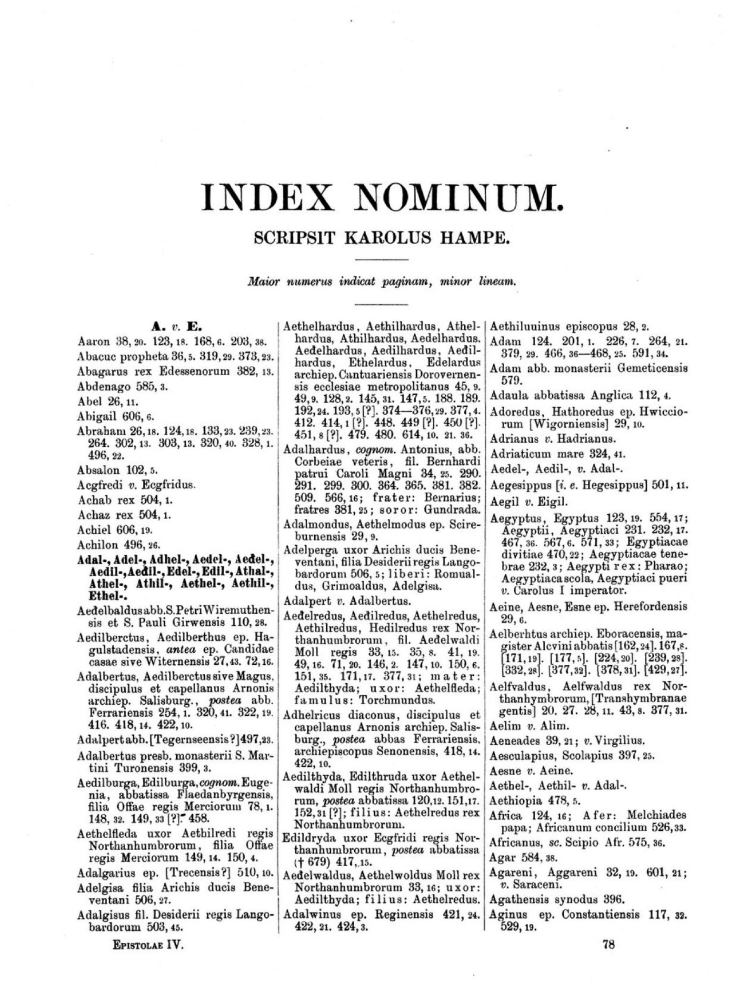

In [88]:
display("data/index_02.JPG")

In [89]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2.imwrite("temp/index_gray.jpg", gray)

True

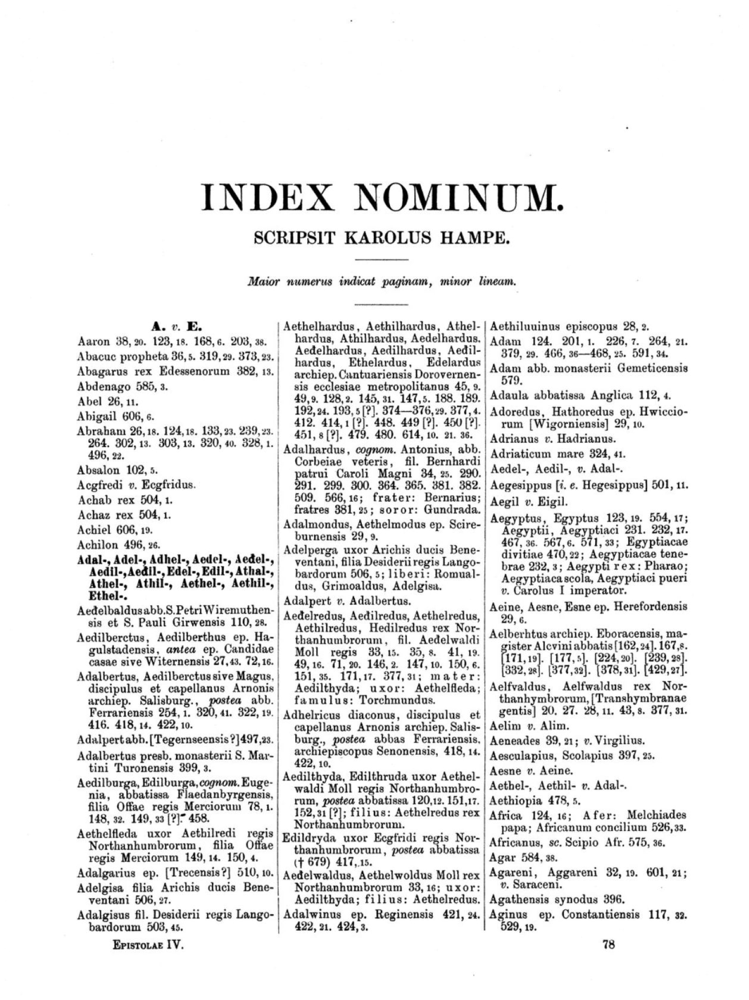

In [90]:
display("temp/index_gray.jpg")

In [91]:
blur = cv2.GaussianBlur(gray, (7,7), 0)
cv2.imwrite("temp/index_blur.jpg", blur)

True

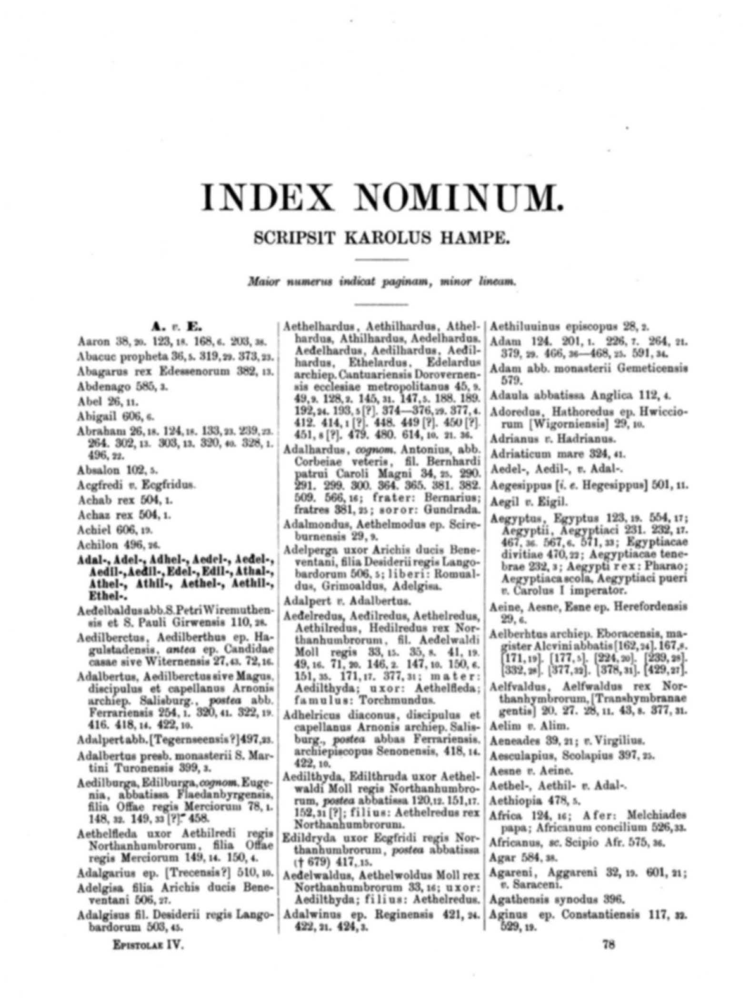

In [92]:
display("temp/index_blur.jpg")

In [93]:
thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
cv2.imwrite("temp/index_thresh.jpg", thresh)

True

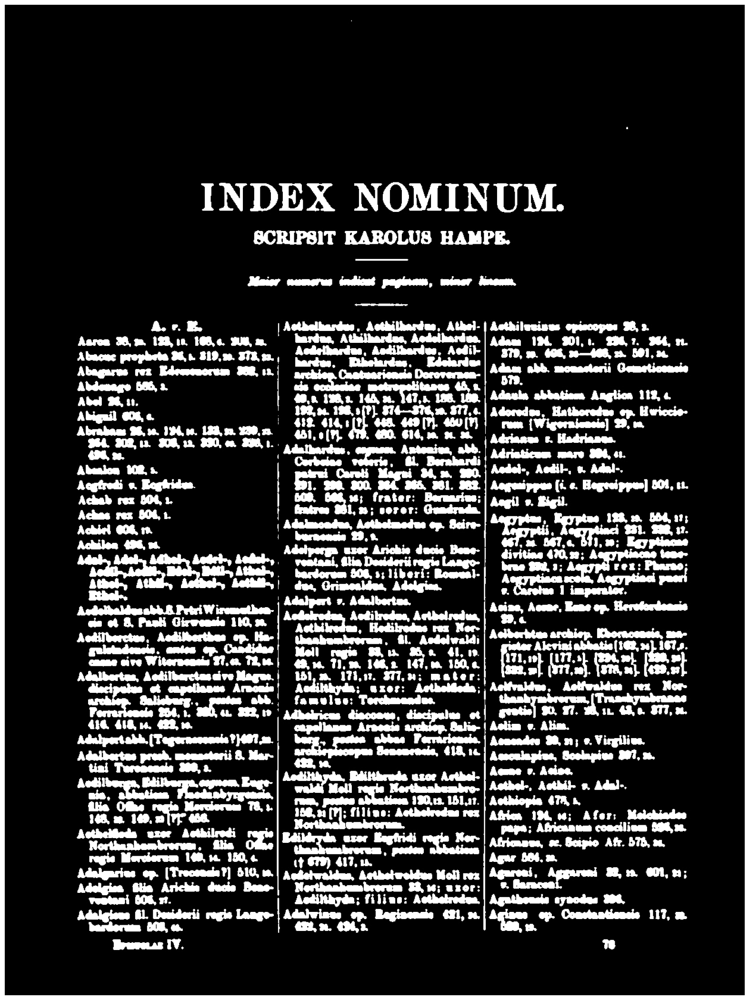

In [94]:
display("temp/index_thresh.jpg")

In [95]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 13))
cv2.imwrite("temp/index_kernel.jpg", kernel)

True

In [96]:
display('temp/index_kernel.jpg')

In [97]:
dilate = cv2.dilate(thresh, kernel, iterations=1)
cv2.imwrite("temp/index_dilate.jpg", dilate)

True

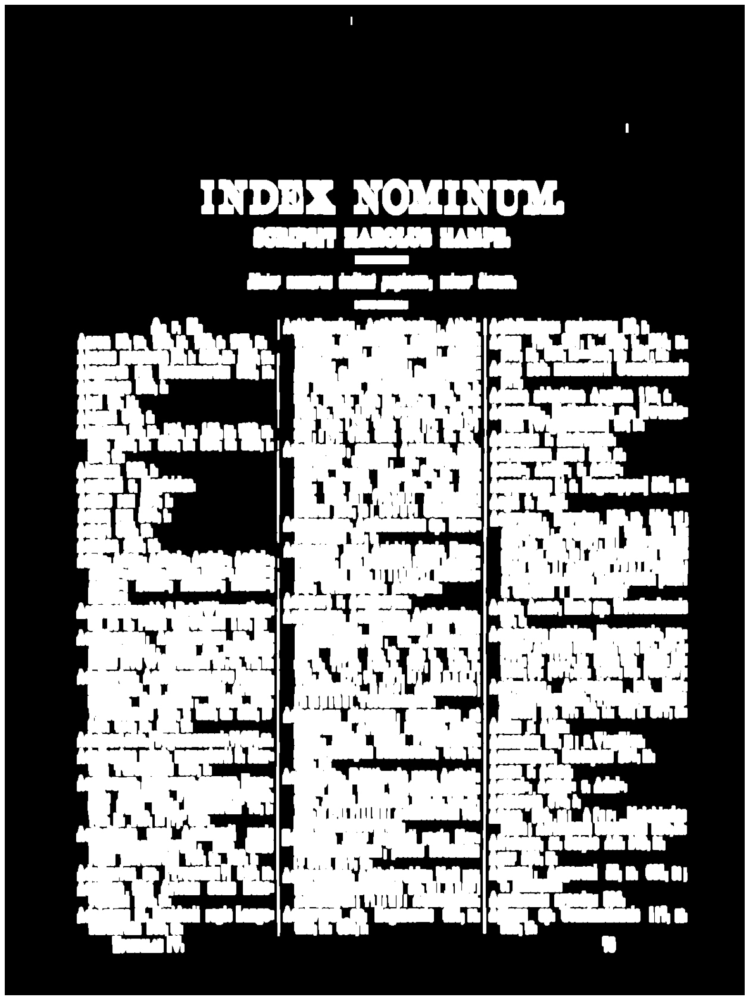

In [98]:
display("temp/index_dilate.jpg")

In [99]:
cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

In [100]:
cnts = cnts[0] if len(cnts) == 2 else cnts[2]

In [101]:
cnts = sorted(cnts, key=lambda x: cv2.boundingRect(x)[0])

In [105]:
results = []
for c in cnts:
    x, y, w, h = cv2.boundingRect(c)
    if h > 200 and w >20:
        roi = image[y:y+h, x:x+h]
        cv2.rectangle(image, (x, y), (x+w, y+h), (36, 255, 12), 2)
        ocr_result = pytesseract.image_to_string(roi)
        ocr_result = ocr_result.split("\n")
        for item in ocr_result:
            item = item.strip()
            item = item.split(" ")[0]
            for item in ocr_result:
                results.append(item)

cv2.imwrite("temp/index_bbox.jpg", image)

True

In [106]:
print(results)

['A.v. E.', '', 'Abacuc propheta 36,5. 319, 29. 373, 23.', '', 'Abagarus rex Edessenorum 382, 13.', '', 'Abdenago 585, 3.', '', 'Abel 26, 11.', '', 'Abigail 606, 6.', '', 'Abraham 26,18, 124,18. 133, 23.', '', '264. 302, 13. 303, 13. 320, 40.', '', '496, 22.', '', 'Absalon 102, 5.', '', 'Acgfredi v. Ecgtridus.', '', 'Achab rex 504, 1.', '', 'Achaz rex 504, 1.', '', 'Achiel 606, 19.', '', 'Achilon 496, 26.', '', 'Adal-, Adel-, Adhel-, Aedel-, Aed', 'Aedil-, Aedil- Edel-, Edil-, Ath', '', 'Ethel-.', 'Aedelbaldusabb.S. Petri Wiremuthen-;', 'sis et S. Pauli Girwensis 110, 28.', "Aedilberctus, Aedilberthus ep. Ha-'", 'gulstadensis, antea ep. Candidae|', 'casae sive Witernensis 27,43. 72,16.', 'Adalbertus, Aedilberctus sive Magus,’', 'discipulus et capellanus Arnonis', 'archiep. Salisburg., postea_abb.', 'Ferrariensis 254, 1. 320, 41. 322, 19.)', '416. 418, 14. 422, 10.', 'Adalpertabb.[Tegernseensis ?]497,23..', 'Adalbertus presb. monasterii 8. Mar-', 'tini Turonensis 399, 3.', '', 'Aedilbur

In [109]:
for item in results:
    item = item.strip()
    item = item.split(" ")[0]
    if len(item) > 0:
        if item[0].isupper():
            print(item)

A.v.
Abacuc
Abagarus
Abdenago
Abel
Abigail
Abraham
Absalon
Acgfredi
Achab
Achaz
Achiel
Achilon
Adal-,
Aedil-,
Ethel-.
Aedelbaldusabb.S.
Aedilberctus,
Adalbertus,
Ferrariensis
Adalpertabb.[Tegernseensis
Adalbertus
Aedilburga,
Aethelfleda
Northanhumbrorum,
Adalgarius
Adelgisa
Adalgisus
Epistozae
Aaron
Athel-,
Aethelhardus,
Aedelhardus,
Corbeiae
Adelperga
Aedelredus,
Aethilredus,
Moll
Aedilthyda;
Adhelricus
Northanhumbrorum.
Aedelwaldus,
Northanhumbrorum
Aedilthyda;
Adalwinus
Aethiluuinus
Adam
Adam
Adaula
Adoredus,
Adrianus
Adriaticum
Aedel-,
Aegesippus
Aegil
Aegyptus,
Aegyptiacascola,
Aeine,
Aelfvaldus,
Aelim
Aeneades
Aesculapius,
Aesne
A.v.
Abacuc
Abagarus
Abdenago
Abel
Abigail
Abraham
Absalon
Acgfredi
Achab
Achaz
Achiel
Achilon
Adal-,
Aedil-,
Ethel-.
Aedelbaldusabb.S.
Aedilberctus,
Adalbertus,
Ferrariensis
Adalpertabb.[Tegernseensis
Adalbertus
Aedilburga,
Aethelfleda
Northanhumbrorum,
Adalgarius
Adelgisa
Adalgisus
Epistozae
Aaron
Athel-,
Aethelhardus,
Aedelhardus,
Corbeiae
Adelperga
Ae

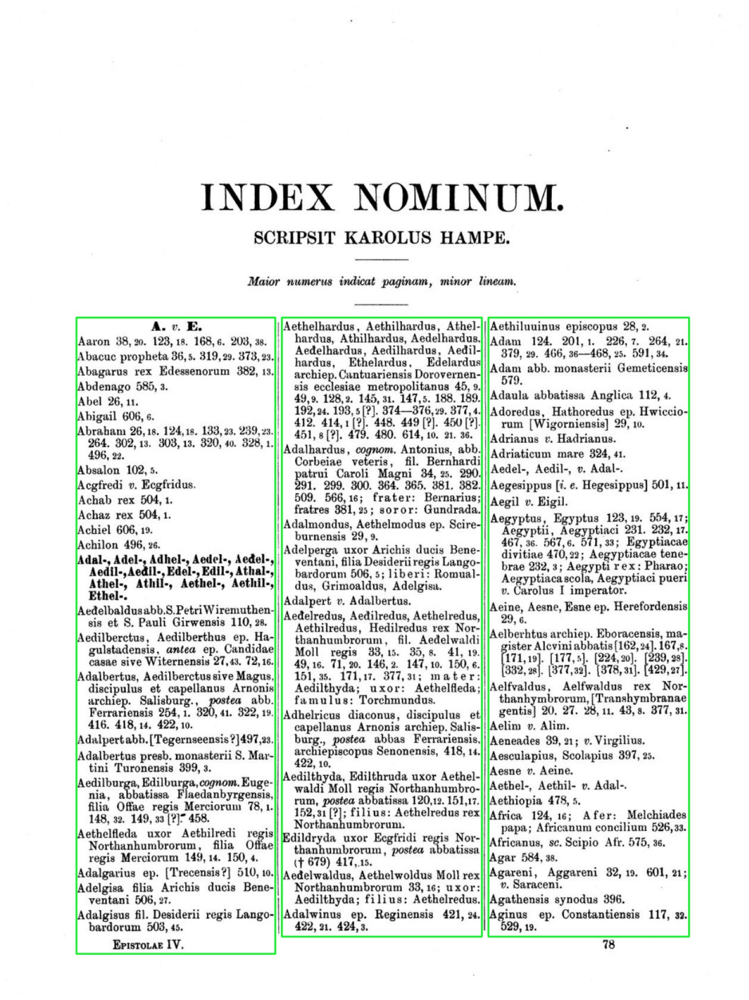

In [103]:
display("temp/index_bbox.jpg")